In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243
torch:  1.12 ; cuda:  cu116


In [2]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
# from detectron2.structures import BoxMode

/home/tin3080/anaconda3/envs/detectron2/lib/python3.7/site-packages/google/colab/data_table.py:30: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  from IPython.utils import traitlets as _traitlets


# Register a COCO Format Dataset

In [3]:
from detectron2.data.datasets import register_coco_instances
DatasetCatalog.clear()

In [4]:
register_coco_instances("train_dataset", {}, "../dataset/FINAL/train/annotation.json", "../dataset/FINAL/train")
register_coco_instances("valid_dataset", {}, "../dataset/FINAL/val/annotation.json", "../dataset/FINAL/val")
register_coco_instances("test_dataset", {}, "../dataset/FINAL/test/annotation.json", "../dataset/FINAL/test")

In [5]:
# load the dictionary
train_dicts = DatasetCatalog.get('train_dataset')
valid_dicts = DatasetCatalog.get('valid_dataset')
test_dicts = DatasetCatalog.get('test_dataset')
# print(dataset_dicts)

[10/19 11:26:52 d2.data.datasets.coco]: Loaded 168 images in COCO format from ../dataset/FINAL/train/annotation.json
[10/19 11:26:52 d2.data.datasets.coco]: Loaded 84 images in COCO format from ../dataset/FINAL/val/annotation.json
[10/19 11:26:52 d2.data.datasets.coco]: Loaded 84 images in COCO format from ../dataset/FINAL/test/annotation.json


In [6]:
cfg = get_cfg()

# cfg.MODEL.DEVICE = "cpu"
# load the pre trained model from Detectron2 model zoo
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
# set confidence threshold for this model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  
# load model weights
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")

In [7]:
# test the model using the image
predictor = DefaultPredictor(cfg)
# outputs = predictor(im)

/home/tin3080/anaconda3/envs/detectron2/lib/python3.7/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/tin3080/KHUONG/SJU_Study/amv_class/detectron2/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y_int = (pos - x_int) // w


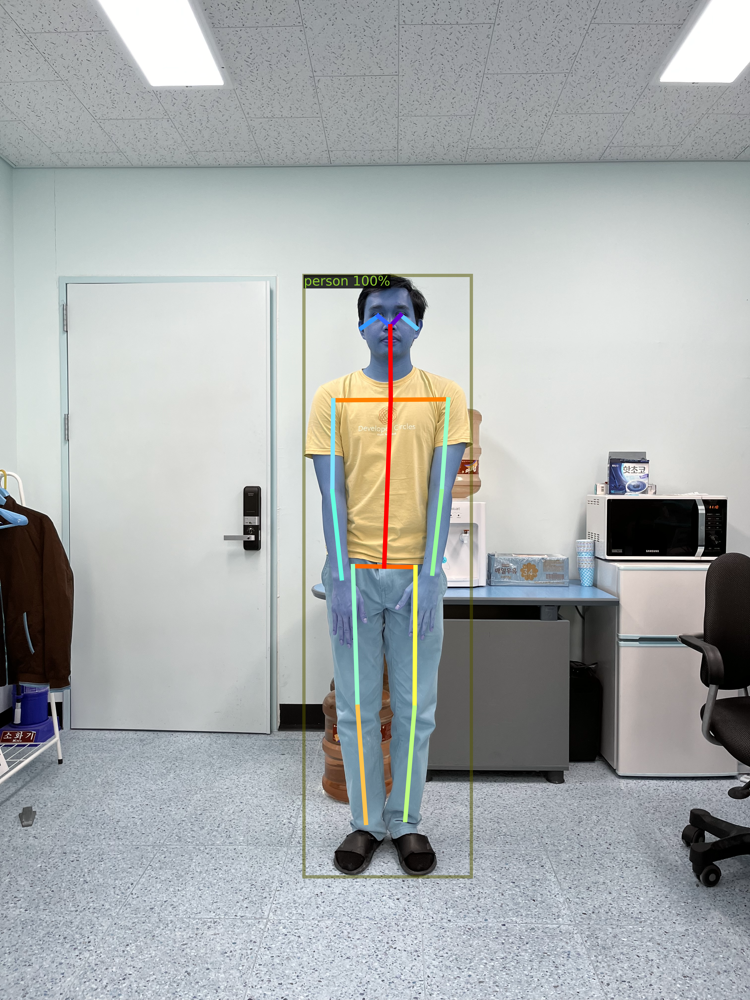

In [8]:
n_samples = 1

# visualize N number of samples
for d in random.sample(train_dicts, n_samples):
    filename = d["file_name"].replace('\\','/')
    # print(d["file_name"])
    # print(filename)
    
    im = cv2.imread(filename)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    predictor = DefaultPredictor(cfg)
    outputs = predictor(im)
    
    v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [9]:
pred_keypoints = outputs["instances"].to("cpu").pred_keypoints.numpy()
pred_keypoints[0]

array([[1.5736335e+03, 1.3154340e+03, 8.8822514e-01],
       [1.6150763e+03, 1.2700955e+03, 9.3548334e-01],
       [1.5246556e+03, 1.2738738e+03, 1.0380787e+00],
       [1.6791243e+03, 1.3229904e+03, 1.3870034e+00],
       [1.4568402e+03, 1.3229904e+03, 1.2883635e+00],
       [1.8072201e+03, 1.6101342e+03, 1.6965997e-01],
       [1.3438145e+03, 1.6139125e+03, 2.0393839e-01],
       [1.7808474e+03, 1.9803987e+03, 5.6748390e-01],
       [1.3400469e+03, 1.9803987e+03, 4.9800003e-01],
       [1.7431722e+03, 2.3128809e+03, 4.8294300e-01],
       [1.3777220e+03, 2.3317720e+03, 4.0533027e-01],
       [1.6753567e+03, 2.2864336e+03, 9.6062131e-02],
       [1.4229325e+03, 2.2826553e+03, 1.0199339e-01],
       [1.6715891e+03, 2.8531648e+03, 3.2733390e-01],
       [1.4417700e+03, 2.8493865e+03, 3.3259377e-01],
       [1.6339139e+03, 3.3065498e+03, 2.9473528e-01],
       [1.4756779e+03, 3.3178843e+03, 3.6674780e-01]], dtype=float32)

# Create a Classifier model

In [10]:
# !pip install pandas
import pandas as pd

In [11]:
def add_to_df(df, keypoints, classlabel):
    temp_dict = dict()
    temp_dict['letter'] = classlabel
    
    for i in range(17):
        temp_dict['x'+str(i)] = keypoints[i,0]
        temp_dict['y'+str(i)] = keypoints[i,1]
    
    df = df.append(temp_dict, ignore_index=True)
    
    return df

In [12]:
# define the dataframe
df = pd.DataFrame(columns = ['x0','y0','x1','y1','x2','y2','x3','y3','x4','y4','x5','y5','x6','y6',
                             'x7','y7','x8','y8','x9','y9','x10','y10','x11','y11','x12','y12',
                             'x13','y13','x14','y14','x15','y15','x16','y16','letter'])
print(df)
# valid_df = train_df.copy()
# test_df = train_df.copy()

Empty DataFrame
Columns: [x0, y0, x1, y1, x2, y2, x3, y3, x4, y4, x5, y5, x6, y6, x7, y7, x8, y8, x9, y9, x10, y10, x11, y11, x12, y12, x13, y13, x14, y14, x15, y15, x16, y16, letter]
Index: []

[0 rows x 35 columns]


In [13]:
def createDataframe(dataset_dicts, df):
    for d in dataset_dicts:
        filename = d["file_name"].replace('\\','/')
    
        im = cv2.imread(filename)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        outputs = predictor(im)
    
        #get keypoints
        pred_keypoints = outputs["instances"].to("cpu").pred_keypoints.numpy()
    
        #get class label based on the filename
        classlabel = filename.rsplit('/')[-1].replace(".jpg","")
        
        #save in the dataframe
        df = add_to_df(df, pred_keypoints[0], classlabel)

    return df

In [14]:
train_set = createDataframe(train_dicts, df)
valid_set = createDataframe(valid_dicts, df)
test_set = createDataframe(test_dicts, df)

/home/tin3080/KHUONG/SJU_Study/amv_class/detectron2/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y_int = (pos - x_int) // w
/home/tin3080/KHUONG/SJU_Study/amv_class/detectron2/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y_int = (pos - x_int) // w
/home/

In [15]:
# # make inference for each images and assign the corresponding class
# for d in dataset_dicts:
#     filename = d["file_name"].replace('\\','/')
    
#     im = cv2.imread(filename)
#     im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
#     outputs = predictor(im)
    
#     #get keypoints
#     pred_keypoints = outputs["instances"].to("cpu").pred_keypoints.numpy()
    
#     #get class label based on the filename
#     classlabel = filename.rsplit('/')[-1].replace(".jpg","")
    
#     #save in the dataframe
#     df = add_to_df(df, pred_keypoints[0], classlabel)

In [16]:
# define the features and target variable
def divideXy(df):
    X = df.drop(columns=['letter'])
    y = df['letter']

    return X, y

In [17]:
# # define the features and target variable
# X = df.drop(columns=['letter'])
# y = df['letter']

In [18]:
X_train, y_train = divideXy(train_set)
X_valid, y_valid = divideXy(valid_set)
X_test, y_test = divideXy(test_set)

In [19]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
X_valid = scaler.fit_transform(X_valid)
X_test = scaler.fit_transform(X_test)

In [20]:
# machine learning model can't utilize letter
class2idx = {'A': 0, 'B': 1, "C": 2, "D": 3, 'E': 4, 'F': 5, "G": 6, "H": 7, 'I': 8, 'J': 9, 'K': 10, "L": 11, "M": 12, 'N': 13, 'O': 14, 'P': 15, "Q": 16, "R": 17, 'S': 18, 'T': 19, 'U': 20, "V": 21, "W": 22, "X": 23, 'Y': 24, 'Z': 25, 'SPACE': 26, 'START-STOP': 27}
idx2class = {v: k for k, v in class2idx.items()}

In [21]:
y_train.replace(class2idx, inplace=True)
y_valid.replace(class2idx, inplace=True)
y_test.replace(class2idx, inplace=True)

In [22]:
# create a dataloader
from torch.utils.data import Dataset, DataLoader
class Data(Dataset):
    def __init__(self, X, y):
        self.x=torch.tensor(X)
        self.y=torch.tensor(y)
        self.len=self.x.shape[0]
    def __getitem__(self,index):
        return self.x[index],self.y[index]
    def __len__(self):
        return self.len

In [23]:
train_dataset = Data(X_train, y_train)
valid_dataset = Data(X_valid, y_valid)
test_dataset = Data(X_test, y_test)

In [24]:
train_loader = DataLoader(dataset=train_dataset, batch_size=64)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=64)
test_loader = DataLoader(dataset=test_dataset, batch_size=64)

### Create classification model using multi-layered perceptron

In [25]:
import torch.nn as nn
import torch.optim as optim

In [26]:
class MulticlassClassification(nn.Module):
    def __init__(self, num_feature, num_class):
        super(MulticlassClassification, self).__init__()
        
        self.layer_1 = nn.Linear(num_feature, 512)
        self.layer_2 = nn.Linear(512, 128)
        self.layer_3 = nn.Linear(128, 64)
        self.layer_out = nn.Linear(64, num_class)
        
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.3)
        self.batchnorm1 = nn.BatchNorm1d(512)
        self.batchnorm2 = nn.BatchNorm1d(128)
        self.batchnorm3 = nn.BatchNorm1d(64)
        
    def forward(self, x):
        x = self.layer_1(x)
        x = self.batchnorm1(x)
        x = self.relu(x)
        
        x = self.layer_2(x)
        x = self.batchnorm2(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.layer_3(x)
        x = self.batchnorm3(x)
        x = self.relu(x)
        x = self.dropout(x)
        
        x = self.layer_out(x)
        
        return x

In [27]:
class convNet(nn.Module):
    def __init__(self, num_class):#, num_feature, num_class):
        super(convNet, self).__init__()

        self.conv1 = nn.Conv1d(in_channels=1,out_channels=16,kernel_size=3,padding=1,stride=1)
        self.conv2 = nn.Conv1d(in_channels=16,out_channels=32,kernel_size=3,padding=1,stride=1)
        self.conv3 = nn.Conv1d(in_channels=32,out_channels=64,kernel_size=3,padding=1,stride=1)
        self.conv4 = nn.Conv1d(in_channels=64,out_channels=64,kernel_size=3,padding=1,stride=1)
        self.conv5 = nn.Conv1d(in_channels=64,out_channels=64,kernel_size=3,padding=1,stride=1)
        
        self.pool = nn.MaxPool1d(kernel_size=2,stride=1)

        self.dropout = nn.Dropout(0.2)

        # self.batchNorm = nn.BatchNorm1d()####

        self.fc1=nn.Linear(64*29,512)
        self.fc2=nn.Linear(512,128)
        self.out=nn.Linear(128,num_class)

    def forward(self, x):
        x = self.pool(nn.LeakyReLU(self.conv1(x)))
        x = self.pool(nn.LeakyReLU(self.conv2(x)))
        x = self.pool(nn.LeakyReLU(self.conv3(x)))
        x = self.pool(nn.LeakyReLU(self.conv4(x)))
        x = self.pool(nn.LeakyReLU(self.conv5(x)))

        x = x.view(x.shape[0], x.size(1) * x.size(2))
        x = self.dropout(x)
        x = self.dropout(nn.relu(self.fc1(x)))
        x = self.dropout(nn.relu(self.fc2(x)))
        x = self.out(x)

        return x

In [41]:
class CNN(nn.Module):
    def __init__(self, num_class):
        super(CNN, self).__init__()

        # 34 x 1
        self.conv1 = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(16),
            nn.LeakyReLU()
            # ,
            # nn.MaxPool1d(kernel_size=2,stride=1)
            )
        # 33 x 16
        self.conv2 = nn.Sequential(
            nn.Conv1d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(32),
            nn.LeakyReLU()
            # ,
            # nn.MaxPool1d(kernel_size=2,stride=1)
            )
        # 32 x 32
        self.conv3 = nn.Sequential(
            nn.Conv1d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(64),
            nn.LeakyReLU()
            # ,
            # nn.MaxPool1d(kernel_size=2,stride=1)
            )
        # 31 x 64
        self.conv4 = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(64),
            nn.LeakyReLU()
            # ,
            # nn.MaxPool1d(kernel_size=2,stride=1)
            )
        # 30 x 64
        self.conv5 = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(),
            nn.Dropout(0.3))

        # 30 x 64
        self.fc1 = nn.Linear(34*64, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, num_class)
        self.activation = nn.Sigmoid()
    
    def forward(self, x):
        # input x : 23 x 59049 x 1
        # expected conv1d input : minibatch_size x num_channel x width

        x = x.view(x.shape[0], 1,-1)
        # x : 23 x 1 x 59049

        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.conv5(out)
        
        out = out.view(x.shape[0], out.size(1) * out.size(2))
        out = self.fc1(out)
        out = self.fc2(out)
        out = self.fc3(out)
        

        logit = self.activation(out)

        return logit

In [42]:
# loader = {'train': train_loader}#, 'val': val_loader}

In [43]:
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [44]:
# for epoch in range(1, EPOCHS + 1):
#         # Train
#         model.train()
#         train_loss = 0.0 
#         train_accu = 0.0
        
# #         valid_loss = 0.0 #########
#         tl=0

#         for images, labels in tqdm.tqdm(loader['train'], desc='train: '):
# #             step_ = step * cfg.train_batch_size
#             images, labels = images.to(device), labels.to(device)
            
#             # predict the outputs
#             outputs = model(images)
        
#             # compute loss and accuracy
#             loss = loss_func(outputs, labels)
#         #     accuracy = ##########################
    
#             # optimization
#             optimizer.zero_grad()
#             loss.backward()
#             optimizer.step()
            
            
#             preds = torch.max(outputs, dim=-1)[1]
#             tl += (preds == labels).sum().item()
            
            
#             train_loss+=loss.item()
#             train_accu+=accuracy.item()

# #             if step % 50 == 0:
# #                 lr = scheduler.get_last_lr()[0]
# #                 print(f'epoch: {epoch}/{cfg.num_epochs} | loss: {loss.item():6f} | lr: {lr:e}')
# #                 writer.add_scalar('loss', loss, step_) ######
# #                 writer.add_scalar('lr', lr, step_)
# #             step += 1


In [45]:
#     # set model to training mode
#     model.train()
    
#     for X_train_batch, y_train_batch in trainloader:
#         X_train_batch, y_train_batch = X_train_batch.to(device), y_train_batch.to(device)
#         optimizer.zero_grad()
        
#         # perform prediction
#         y_train_pred = model(X_train_batch)
        
#         # compute for loss and accuracy
#         train_loss = criterion(y_train_pred, y_train_batch)
#         train_acc = multi_acc(y_train_pred, y_train_batch)
        
#         # optimization
#         train_loss.backward()
#         optimizer.step()
        
#         train_epoch_loss += train_loss.item()
#         train_epoch_acc += train_acc.item()
        
#     loss_stats['train'].append(train_epoch_loss/len(trainloader))
#     accuracy_stats['train'].append(train_epoch_acc/len(trainloader))
    
#     print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(trainloader):.5f} | Train Acc: {train_epoch_acc/len(trainloader):.5f}')

In [46]:
# class MulticlassClassification(nn.Module):
#     def __init__(self, num_feature, num_class):
#         super(MulticlassClassification, self).__init__()
        
#         self.layer_1 = nn.Linear(num_feature, 512)
#         self.layer_2 = nn.Linear(512, 128)
#         self.layer_3 = nn.Linear(128, 64)
#         self.layer_out = nn.Linear(64, num_class)
        
#         self.relu = nn.ReLU()
#         self.dropout = nn.Dropout(p=0.2)
#         self.batchnorm1 = nn.BatchNorm1d(512)
#         self.batchnorm2 = nn.BatchNorm1d(128)
#         self.batchnorm3 = nn.BatchNorm1d(64)
        
#     def forward(self, x):
#         x = self.layer_1(x)
#         x = self.batchnorm1(x)
#         x = self.relu(x)
        
#         x = self.layer_2(x)
#         x = self.batchnorm2(x)
#         x = self.relu(x)
#         x = self.dropout(x)
        
#         x = self.layer_3(x)
#         x = self.batchnorm3(x)
#         x = self.relu(x)
#         x = self.dropout(x)
        
#         x = self.layer_out(x)
        
#         return x

In [47]:
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
# print(model)

In [48]:
# print('W:',list(model1.parameters())[0].size())
# print('b',list(model1.parameters())[1].size())

In [49]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [50]:
# EPOCHS = 1500
BATCH_SIZE = 64
# LEARNING_RATE = 0.00001
NUM_FEATURES = 34
NUM_CLASSES = 28

In [51]:
# model1 = MulticlassClassification(num_feature=NUM_FEATURES, num_class=NUM_CLASSES)
# model1.to(device)
# model2 = SampleCNN(num_class=NUM_CLASSES)
# model2.to(device)

In [52]:
def multi_acc(y_pred, y_test):
    y_pred_softmax = torch.log_softmax(y_pred, dim = 1)
    _, y_pred_tags = torch.max(y_pred_softmax, dim = 1)
    
    correct_pred = (y_pred_tags == y_test).float()
    acc = correct_pred.sum() / len(correct_pred)
    
    acc = torch.round(acc * 100)
    
    return acc

In [53]:
model1 = MulticlassClassification(num_feature=NUM_FEATURES, num_class=NUM_CLASSES)
model1.to(device)
model2 = CNN(num_class=NUM_CLASSES)
model2.to(device)

CNN(
  (conv1): Sequential(
    (0): Conv1d(1, 16, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (conv2): Sequential(
    (0): Conv1d(16, 32, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (conv3): Sequential(
    (0): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (conv4): Sequential(
    (0): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (conv5): Sequential(
    (0): Conv1d(64, 64, kernel_size=(3,), stride=(1,), padding=(1,))
    

In [54]:
criterion = nn.CrossEntropyLoss()

In [55]:
def training(model, lr, EPOCHS):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    # minimum validation loss ----- set initial minimum to infinity
    valid_loss_min = np.Inf 
    # scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)
    accuracy_keeper = {'train': [], 'valid': []}
    loss_keeper = {'train': [], 'valid': []}
    for epoch in range(EPOCHS):
        
        train_epoch_loss = 0.0
        train_epoch_acc = 0.0
        valid_epoch_loss = 0.0
        valid_epoch_acc = 0.0
        """
        TRAINING PHASE
        """
        # set model to training mode
        model.train()
        for X_train_batch, y_train_batch in train_loader:
            X_train_batch, y_train_batch = X_train_batch.to(device), y_train_batch.to(device)
            optimizer.zero_grad()
            # perform prediction
            y_train_pred = model(X_train_batch)
            # compute for loss and accuracy
            train_loss = criterion(y_train_pred, y_train_batch)
            train_acc = multi_acc(y_train_pred, y_train_batch) ##############
            # optimization
            train_loss.backward()
            optimizer.step()
            
            train_epoch_loss += train_loss.item()
            train_epoch_acc += train_acc.item()

        """
        VALIDATION PHASE
        """
        model.eval()
        for X_valid_batch, y_valid_batch in valid_loader:
            X_valid_batch, y_valid_batch = X_valid_batch.to(device), y_valid_batch.to(device)
            y_valid_pred = model(X_valid_batch)
            valid_loss = criterion(y_valid_pred, y_valid_batch)
            valid_acc = multi_acc(y_valid_pred, y_valid_batch)

            valid_epoch_loss += valid_loss.item()
            valid_epoch_acc += valid_acc.item()


            
        loss_keeper['train'].append(train_epoch_loss/len(train_loader))
        loss_keeper['valid'].append(valid_epoch_loss/len(valid_loader))
        accuracy_keeper['train'].append(train_epoch_acc/len(train_loader))
        accuracy_keeper['valid'].append(valid_epoch_acc/len(valid_loader))

        print(f"\nEpoch : {epoch+1}\tTraining Loss : {train_epoch_loss/len(train_loader):.5f}\tTrain Accuracy : {train_epoch_acc/len(train_loader):.5f}")
        print(f"\n\t\tValidation Loss : {valid_epoch_loss/len(valid_loader):.5f}\tValidation Accuracy : {valid_epoch_acc/len(valid_loader):.5f}")
        
        if valid_loss<=valid_loss_min:
            print(f"Validation loss decreased from : {valid_loss_min} ----> {valid_loss} ----> Saving Model.......")
            z=type(model).__name__
            torch.save(model.state_dict(), z+'_model.pkl')
            valid_loss_min=valid_loss

        # scheduler.step()

    return loss_keeper, accuracy_keeper
        # print(f'Epoch {e+0:03}: | Train Loss: {train_epoch_loss/len(trainloader):.5f} | Train Acc: {train_epoch_acc/len(trainloader):.5f}')

In [56]:
loss1, accuracy1 = training(model1, lr=0.0001, EPOCHS=1000)


Epoch : 1	Training Loss : 3.43889	Train Accuracy : 3.33333

		Validation Loss : 3.32960	Validation Accuracy : 4.00000
Validation loss decreased from : inf ----> 3.319305896759033 ----> Saving Model.......

Epoch : 2	Training Loss : 3.34573	Train Accuracy : 4.33333

		Validation Loss : 3.32741	Validation Accuracy : 4.00000
Validation loss decreased from : 3.319305896759033 ----> 3.314680814743042 ----> Saving Model.......

Epoch : 3	Training Loss : 3.29086	Train Accuracy : 9.00000

		Validation Loss : 3.32703	Validation Accuracy : 4.00000
Validation loss decreased from : 3.314680814743042 ----> 3.314075469970703 ----> Saving Model.......

Epoch : 4	Training Loss : 3.29161	Train Accuracy : 8.33333

		Validation Loss : 3.32533	Validation Accuracy : 4.00000
Validation loss decreased from : 3.314075469970703 ----> 3.311176300048828 ----> Saving Model.......

Epoch : 5	Training Loss : 3.28387	Train Accuracy : 7.33333

		Validation Loss : 3.32196	Validation Accuracy : 4.00000
Validation loss

In [57]:
loss2, accuracy2 = training(model2, lr=0.0001, EPOCHS=1400)


Epoch : 1	Training Loss : 3.33400	Train Accuracy : 3.33333

		Validation Loss : 3.33245	Validation Accuracy : 4.00000
Validation loss decreased from : inf ----> 3.332782030105591 ----> Saving Model.......

Epoch : 2	Training Loss : 3.31261	Train Accuracy : 11.00000

		Validation Loss : 3.33252	Validation Accuracy : 4.00000

Epoch : 3	Training Loss : 3.28736	Train Accuracy : 17.00000

		Validation Loss : 3.33254	Validation Accuracy : 4.00000

Epoch : 4	Training Loss : 3.26957	Train Accuracy : 25.00000

		Validation Loss : 3.33249	Validation Accuracy : 4.00000

Epoch : 5	Training Loss : 3.24577	Train Accuracy : 31.00000

		Validation Loss : 3.33230	Validation Accuracy : 4.00000

Epoch : 6	Training Loss : 3.22603	Train Accuracy : 34.66667

		Validation Loss : 3.33170	Validation Accuracy : 4.00000
Validation loss decreased from : 3.332782030105591 ----> 3.3327624797821045 ----> Saving Model.......

Epoch : 7	Training Loss : 3.20420	Train Accuracy : 37.33333

		Validation Loss : 3.33055	Va

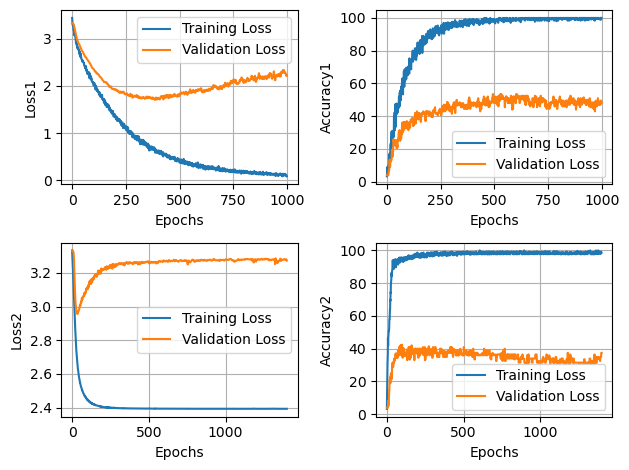

In [58]:
import matplotlib.pyplot as plt

fig = plt.figure()
plt.subplot(2,2,1)
plt.plot(loss1['train'],label="Training Loss")
plt.plot(loss1['valid'],label="Validation Loss")
# plt.ylim(0.93, 1)
plt.xlabel('Epochs')
plt.ylabel('Loss1')
plt.grid()
plt.legend()

plt.subplot(2,2,2)
plt.plot(accuracy1['train'],label="Training Loss")
plt.plot(accuracy1['valid'],label="Validation Loss")
plt.xlabel('Epochs')
plt.ylabel('Accuracy1')
plt.grid()
plt.legend()

plt.subplot(2,2,3)
plt.plot(loss2['train'],label="Training Loss")
plt.plot(loss2['valid'],label="Validation Loss")
# plt.ylim(0.0225, 0.0245)
plt.xlabel('Epochs')
plt.ylabel('Loss2')
# plt.suptitle(cfg.title)
plt.tight_layout()
plt.grid()
plt.legend()

plt.subplot(2,2,4)
plt.plot(accuracy2['train'],label="Training Loss")
plt.plot(accuracy2['valid'],label="Validation Loss")
plt.xlabel('Epochs')
plt.ylabel('Accuracy2')
plt.grid()
plt.legend()
plt.show()

# Inference using Detectron2 and Classifier Model

In [59]:
import matplotlib.pyplot as plt
# predict a sample in dataset
df = pd.DataFrame(columns = ['x0','y0','x1','y1','x2','y2','x3','y3','x4','y4','x5','y5','x6','y6',
                             'x7','y7','x8','y8','x9','y9','x10','y10','x11','y11','x12','y12',
                             'x13','y13','x14','y14','x15','y15','x16','y16','letter'])

/home/tin3080/KHUONG/SJU_Study/amv_class/detectron2/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y_int = (pos - x_int) // w


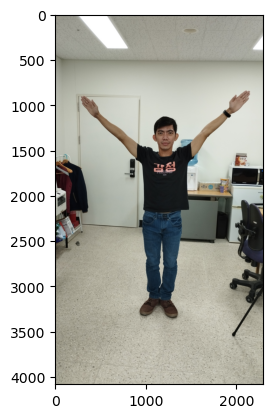

In [60]:
n_samples = 1
# visualize N number of samples
for d in random.sample(test_dicts, n_samples):
    filename = d["file_name"].replace('\\','/')
#     print(filename)
    
    im = cv2.imread(filename)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    # predictor = DefaultPredictor(cfg)
    outputs = predictor(im)

    # show image
    plt.imshow(im)

    #get keypoints
    pred_keypoints = outputs["instances"].to("cpu").pred_keypoints.numpy()
    
    #get class label based on the filename
    classlabel = filename.rsplit('/')[-1].replace(".jpg","")
    
    #save in the dataframe
    df = add_to_df(df, pred_keypoints[0], classlabel)

In [61]:
# define the features and target variable
X = df.drop(columns=['letter'])
y = df['letter']

X = scaler.transform(X)
y.replace(class2idx, inplace=True)
# print(y.values)

X_tensor = torch.tensor(X)
y_tensor = torch.tensor(y.values)

model1.eval()

X_tensor = X_tensor.to(device)
y_tensor = y_tensor.to(device)

y_pred = model1(X_tensor)
y_pred_softmax = torch.log_softmax(y_pred, dim=1)
_, y_pred_tags = torch.max(y_pred_softmax, dim=1)

In [62]:
# print(idx2class)
print(idx2class[y_pred_tags.item()])

Q


In [63]:
# cfg = get_cfg()

# # cfg.MODEL.DEVICE = "cpu"
# # load the pre trained model from Detectron2 model zoo
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
# # set confidence threshold for this model
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  
# # load model weights
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")

In [64]:
# import matplotlib.pyplot as plt
# im = cv2.imread("demo11.jpeg")

# def cv2_imshow(im):
#     im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
#     plt.figure(figsize=(25,7.5)), plt.imshow(im), plt.axis('off');
    
# # test the model using the image
# predictor = DefaultPredictor(cfg)
# outputs = predictor(im)

In [65]:
# pred_keypoints = outputs["instances"].to("cpu").pred_keypoints.numpy()
# pred_keypoints[0]